In [ ]:
from google.colab import files
uploaded = files.upload()

Saving DataZipCombined.zip to DataZipCombined.zip


# Extracting Dataset from ZIP Archive

This cell extracts the contents of DataZipCombined.zip into a specified folder using Python’s zipfile module. It ensures the destination directory exists, performs the extraction, and then lists the extracted files to confirm successful setup of the working dataset.

In [ ]:
import zipfile
import os

zip_file = "DataZipCombined.zip"
extract_path = "/content/my_extracted_folder/"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_file, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete! Files are in:", extract_path)
print(os.listdir(extract_path))


Extraction complete! Files are in: /content/my_extracted_folder/
['DataZipExtracted']


# Environment Setup and Directory Configuration

This cell initializes the environment by importing required libraries for data handling, preprocessing, model training, and visualization. It also defines constants for image dimensions and sets up directory paths for training images and their corresponding masks. These configurations are essential for loading and processing the dataset in subsequent steps.

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from glob import glob

IMG_HEIGHT = 256
IMG_WIDTH = 256
IMG_CHANNELS = 3

BASE_DIR = '/content/my_extracted_folder/DataZipExtracted/Data/'
TRAIN_IMAGE_DIR = os.path.join(BASE_DIR, 'Train/Train Images')
TRAIN_MASK_DIR = os.path.join(BASE_DIR, 'Train/Train Labels')


# Image and Mask Preprocessing Functions

This cell defines two utility functions to preprocess input images and corresponding masks. The load_image() function loads an image, resizes it to the target dimensions, and normalizes pixel values to the [0, 1] range. The load_mask() function does the same for masks but retains grayscale format, which is important for preserving pixel-level details needed for segmentation tasks.

In [ ]:
def load_image(path):
    img = load_img(path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img = img_to_array(img) / 255.0
    return img

def load_mask(path):
    mask = load_img(path, color_mode="grayscale", target_size=(IMG_HEIGHT, IMG_WIDTH))
    mask = img_to_array(mask) / 255.0
    return mask


# Loading and Preparing Image-Mask Pairs

This cell gathers all training image and mask file paths, ensuring both lists are sorted for correct pairing. It checks that the number of images matches the number of masks, then loads and preprocesses each using the previously defined functions. Finally, it converts the loaded data into NumPy arrays and prints their shapes to verify successful loading and consistent formatting for model input.

In [ ]:
image_paths = sorted(glob(os.path.join(TRAIN_IMAGE_DIR, "*.jpg")))
mask_paths = sorted(glob(os.path.join(TRAIN_MASK_DIR, "*.jpg")))

print(f"Total images found: {len(image_paths)}")
print(f"Total masks found: {len(mask_paths)}")

assert len(image_paths) == len(mask_paths), "Images and Masks count mismatch!"

images = [load_image(p) for p in image_paths]
masks = [load_mask(p) for p in mask_paths]

images = np.array(images)
masks = np.array(masks)

print("Shape of images:", images.shape)
print("Shape of masks:", masks.shape)


Total images found: 876
Total masks found: 876
Shape of images: (876, 256, 256, 3)
Shape of masks: (876, 256, 256, 1)


# Multiclass Mask Conversion and Data Splitting

This cell first converts grayscale masks into discrete multiclass masks by applying pixel intensity thresholds to separate regions like teeth, nerve, and their overlap. Each region is assigned a unique class label (1, 2, or 3). After conversion, the dataset is split into training and validation sets using an 90-10 ratio to ensure the model is evaluated on unseen data during training.

In [ ]:
def convert_to_multiclass_mask(mask):
    teeth_mask = (mask >= 0.1) & (mask < 0.4)
    nerve_mask = (mask >= 0.4) & (mask < 0.7)
    overlap_mask = (mask >= 0.7)

    new_mask = np.zeros_like(mask, dtype=np.uint8)
    new_mask[teeth_mask] = 1
    new_mask[nerve_mask] = 2
    new_mask[overlap_mask] = 3

    return new_mask

masks = np.array([convert_to_multiclass_mask(m) for m in masks])

X_train, X_val, y_train, y_val = train_test_split(
    images, masks, test_size=0.1, random_state=42
)

print(f"Training samples: {len(X_train)}")
print(f"Validation samples: {len(X_val)}")

Training samples: 788
Validation samples: 88


# Visualizing Sample Image and Mask Pair

This cell defines a function to display a training image alongside its corresponding ground truth mask for visual verification. It uses matplotlib to plot the input image and its multiclass mask side by side. The cell also prints the unique class values present in the masks to confirm correct mask encoding.

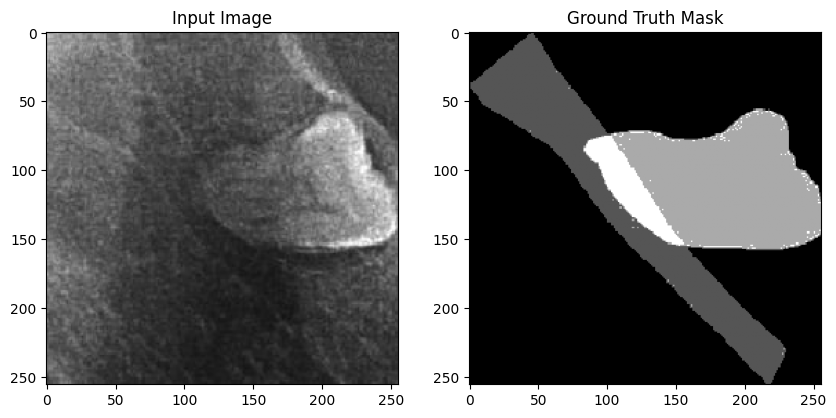

Unique values in masks: [0 1 2 3]


In [ ]:
def show_sample(index):
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(X_train[index])
    plt.title("Input Image")

    plt.subplot(1, 2, 2)
    plt.imshow(y_train[index].squeeze(), cmap='gray')
    plt.title("Ground Truth Mask")
    plt.show()

show_sample(0)

import numpy as np

print("Unique values in masks:", np.unique(masks))

# Building DeepLabV3+ Segmentation Model with MobileNetV2 Backbone

This cell defines a DeepLabV3+ model architecture using MobileNetV2 as the encoder backbone with pretrained ImageNet weights. Key intermediate layers are extracted for feature fusion. The decoder upsamples and combines high-level and low-level features through convolution and bilinear upsampling. The final output layer produces a multiclass segmentation map with softmax activation for pixel-wise class probabilities. This model is designed for efficient and accurate semantic segmentation on 256x256 RGB images.

In [ ]:
def build_deeplabv3plus(input_shape=(256, 256, 3), num_classes=4):
    import tensorflow as tf
    from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, Concatenate
    from tensorflow.keras.models import Model
    from tensorflow.keras.applications import MobileNetV2

    base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')

    layer_names = [
        'block_1_expand_relu',
        'block_3_expand_relu',
        'block_6_expand_relu',
        'block_13_expand_relu',
        'block_16_project',
    ]
    layers = [base_model.get_layer(name).output for name in layer_names]

    x = layers[-1]
    x = Conv2D(256, 1, padding='same', activation='relu')(x)
    x = UpSampling2D(size=(32, 32), interpolation='bilinear')(x)

    low_level_feature = layers[0]
    low_level_feature = Conv2D(48, 1, padding='same', activation='relu')(low_level_feature)
    low_level_feature = UpSampling2D(size=(2, 2), interpolation='bilinear')(low_level_feature)

    x = Concatenate()([x, low_level_feature])
    x = Conv2D(256, 3, padding='same', activation='relu')(x)
    x = Conv2D(256, 3, padding='same', activation='relu')(x)

    outputs = Conv2D(num_classes, 1, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=outputs)
    return model

# Model Compilation with Optimizer and Loss Function

This cell initializes the DeepLabV3+ segmentation model and compiles it with the Adam optimizer using a learning rate of 0.0001. It sets sparse_categorical_crossentropy as the loss function, suitable for multiclass segmentation with integer labels, and tracks accuracy as the evaluation metric during training.

In [ ]:
segmentation_model = build_deeplabv3plus(input_shape=(256, 256, 3), num_classes=4)

segmentation_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

<ipython-input-9-267977931c7b>:7: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(input_shape=input_shape, include_top=False, weights='imagenet')


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


# Model Training with Callbacks for Optimization

This cell trains the segmentation model on the prepared dataset for up to 25 epochs with a batch size of 8. It uses callbacks to improve training efficiency: ModelCheckpoint saves the best model based on validation loss, ReduceLROnPlateau lowers the learning rate if validation loss plateaus, and EarlyStopping halts training early to prevent overfitting by restoring the best weights. Validation data is used to monitor model performance throughout training.

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

checkpoint = ModelCheckpoint("best_model.h5", monitor='val_loss', save_best_only=True, mode='min')
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = segmentation_model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=25,
    batch_size=8,
    callbacks=[checkpoint, reduce_lr, early_stop],
    verbose=1
)

Epoch 1/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6938 - loss: 0.8543   

99/99 ━━━━━━━━━━━━━━━━━━━━ 256s 2s/step - accuracy: 0.6945 - loss: 0.8524 - val_accuracy: 0.7150 - val_loss: 0.8040 - learning_rate: 1.0000e-04
Epoch 2/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 865ms/step - accuracy: 0.8221 - loss: 0.4368

99/99 ━━━━━━━━━━━━━━━━━━━━ 128s 925ms/step - accuracy: 0.8222 - loss: 0.4366 - val_accuracy: 0.7464 - val_loss: 0.7211 - learning_rate: 1.0000e-04
Epoch 3/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 88s 888ms/step - accuracy: 0.8575 - loss: 0.3549 - val_accuracy: 0.7517 - val_loss: 0.7940 - learning_rate: 1.0000e-04
Epoch 4/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 864ms/step - accuracy: 0.8777 - loss: 0.3071

99/99 ━━━━━━━━━━━━━━━━━━━━ 145s 924ms/step - accuracy: 0.8778 - loss: 0.3070 - val_accuracy: 0.7643 - val_loss: 0.6523 - learning_rate: 1.0000e-04
Epoch 5/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 869ms/step - accuracy: 0.8949 - loss: 0.2740

99/99 ━━━━━━━━━━━━━━━━━━━━ 142s 929ms/step - accuracy: 0.8949 - loss: 0.2739 - val_accuracy: 0.7947 - val_loss: 0.5819 - learning_rate: 1.0000e-04
Epoch 6/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - accuracy: 0.9094 - loss: 0.2405

99/99 ━━━━━━━━━━━━━━━━━━━━ 142s 928ms/step - accuracy: 0.9094 - loss: 0.2405 - val_accuracy: 0.7980 - val_loss: 0.5744 - learning_rate: 1.0000e-04
Epoch 7/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 90s 907ms/step - accuracy: 0.9184 - loss: 0.2193 - val_accuracy: 0.7482 - val_loss: 0.7218 - learning_rate: 1.0000e-04
Epoch 8/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 141s 896ms/step - accuracy: 0.9212 - loss: 0.2100 - val_accuracy: 0.7954 - val_loss: 0.5774 - learning_rate: 1.0000e-04
Epoch 9/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 866ms/step - accuracy: 0.9283 - loss: 0.1936

99/99 ━━━━━━━━━━━━━━━━━━━━ 145s 926ms/step - accuracy: 0.9283 - loss: 0.1936 - val_accuracy: 0.8097 - val_loss: 0.5601 - learning_rate: 1.0000e-04
Epoch 10/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 869ms/step - accuracy: 0.9305 - loss: 0.1863

99/99 ━━━━━━━━━━━━━━━━━━━━ 142s 929ms/step - accuracy: 0.9305 - loss: 0.1863 - val_accuracy: 0.8118 - val_loss: 0.5587 - learning_rate: 1.0000e-04
Epoch 11/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 88s 888ms/step - accuracy: 0.9357 - loss: 0.1741 - val_accuracy: 0.8031 - val_loss: 0.5981 - learning_rate: 1.0000e-04
Epoch 12/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 860ms/step - accuracy: 0.9382 - loss: 0.1667

99/99 ━━━━━━━━━━━━━━━━━━━━ 143s 901ms/step - accuracy: 0.9382 - loss: 0.1667 - val_accuracy: 0.8236 - val_loss: 0.5255 - learning_rate: 1.0000e-04
Epoch 13/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 144s 920ms/step - accuracy: 0.9391 - loss: 0.1638 - val_accuracy: 0.7848 - val_loss: 0.6854 - learning_rate: 1.0000e-04
Epoch 14/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - accuracy: 0.9397 - loss: 0.1625

99/99 ━━━━━━━━━━━━━━━━━━━━ 141s 909ms/step - accuracy: 0.9397 - loss: 0.1625 - val_accuracy: 0.8495 - val_loss: 0.4417 - learning_rate: 1.0000e-04
Epoch 15/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 863ms/step - accuracy: 0.9422 - loss: 0.1562

99/99 ━━━━━━━━━━━━━━━━━━━━ 143s 923ms/step - accuracy: 0.9421 - loss: 0.1562 - val_accuracy: 0.8524 - val_loss: 0.4268 - learning_rate: 1.0000e-04
Epoch 16/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 867ms/step - accuracy: 0.9433 - loss: 0.1528

99/99 ━━━━━━━━━━━━━━━━━━━━ 140s 908ms/step - accuracy: 0.9433 - loss: 0.1528 - val_accuracy: 0.8639 - val_loss: 0.4024 - learning_rate: 1.0000e-04
Epoch 17/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 868ms/step - accuracy: 0.9452 - loss: 0.1473

99/99 ━━━━━━━━━━━━━━━━━━━━ 142s 909ms/step - accuracy: 0.9452 - loss: 0.1473 - val_accuracy: 0.8802 - val_loss: 0.3606 - learning_rate: 1.0000e-04
Epoch 18/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 854ms/step - accuracy: 0.9475 - loss: 0.1416

99/99 ━━━━━━━━━━━━━━━━━━━━ 90s 914ms/step - accuracy: 0.9475 - loss: 0.1416 - val_accuracy: 0.8781 - val_loss: 0.3480 - learning_rate: 1.0000e-04
Epoch 19/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 862ms/step - accuracy: 0.9476 - loss: 0.1411

99/99 ━━━━━━━━━━━━━━━━━━━━ 143s 921ms/step - accuracy: 0.9476 - loss: 0.1411 - val_accuracy: 0.8831 - val_loss: 0.3466 - learning_rate: 1.0000e-04
Epoch 20/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 140s 898ms/step - accuracy: 0.9485 - loss: 0.1389 - val_accuracy: 0.8715 - val_loss: 0.3794 - learning_rate: 1.0000e-04
Epoch 21/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 88s 887ms/step - accuracy: 0.9495 - loss: 0.1355 - val_accuracy: 0.8833 - val_loss: 0.3549 - learning_rate: 1.0000e-04
Epoch 22/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 863ms/step - accuracy: 0.9492 - loss: 0.1370
Epoch 22: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
99/99 ━━━━━━━━━━━━━━━━━━━━ 143s 897ms/step - accuracy: 0.9492 - loss: 0.1371 - val_accuracy: 0.8812 - val_loss: 0.3488 - learning_rate: 1.0000e-04
Epoch 23/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 0s 865ms/step - accuracy: 0.9507 - loss: 0.1336

99/99 ━━━━━━━━━━━━━━━━━━━━ 145s 926ms/step - accuracy: 0.9507 - loss: 0.1336 - val_accuracy: 0.8907 - val_loss: 0.3344 - learning_rate: 5.0000e-05
Epoch 24/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 141s 915ms/step - accuracy: 0.9553 - loss: 0.1208 - val_accuracy: 0.8903 - val_loss: 0.3364 - learning_rate: 5.0000e-05
Epoch 25/25
99/99 ━━━━━━━━━━━━━━━━━━━━ 139s 887ms/step - accuracy: 0.9566 - loss: 0.1169 - val_accuracy: 0.8904 - val_loss: 0.3427 - learning_rate: 5.0000e-05


# Visualizing Model Predictions Against Ground Truth

This cell defines functions to decode the model’s softmax output into grayscale segmentation masks with distinct intensity values for each class. It then visualizes multiple samples by displaying the original input image, the corresponding ground truth mask, and the model’s predicted mask side-by-side. This allows qualitative evaluation of the model’s segmentation performance on validation data.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━

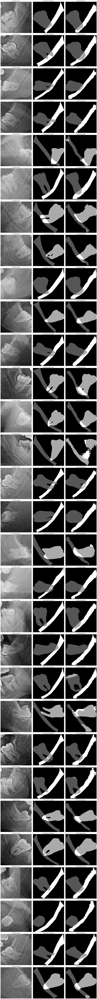

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def decode_segmentation_mask(pred_mask):
    pred_labels = np.argmax(pred_mask, axis=-1)

    intensity_map = {
        0: 0,
        1: 85,
        2: 170,
        3: 255
    }

    decoded_mask = np.zeros_like(pred_labels, dtype=np.uint8)
    for k, v in intensity_map.items():
        decoded_mask[pred_labels == k] = v

    return decoded_mask

def show_multiple_predictions(num_samples=5):
    plt.figure(figsize=(18, 6 * num_samples))

    for i in range(num_samples):
        pred = segmentation_model.predict(np.expand_dims(X_val[i], axis=0))[0]
        decoded = decode_segmentation_mask(pred)

        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(X_val[i])
        plt.title(f"[{i}] Input Image")
        plt.axis('off')

        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(y_val[i].squeeze() * 85, cmap='gray')
        plt.title(f"[{i}] Ground Truth Mask")
        plt.axis('off')

        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(decoded, cmap='gray')
        plt.title(f"[{i}] Predicted Mask")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

show_multiple_predictions(num_samples=30)

# Preparing Labels for Binary Classification

This cell marks the transition from segmentation to classification by labeling each mask file based on its filename. If the filename contains (1), it is categorized as class 1 (contact), otherwise as class 0 (no contact). A DataFrame is then created to associate each file with its respective label. This labeled data will be used to train a binary classification model to predict contact presence.

In [ ]:
import numpy as np
import pandas as pd

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random

import os

filenames = os.listdir("/content/my_extracted_folder/DataZipExtracted/Data/Train/Train Labels")
categories = []
for filename in filenames:
    category = filename.split('.')[1]
    if category == '(1)':
        categories.append(1)
    else:
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})
df.head()

,filename,category
0,56.(1).jpg,1
1,657.(0).jpg,0
2,561.(0).jpg,0
3,415.(1).jpg,1
4,417.(1).jpg,1


<Axes: xlabel='category'>

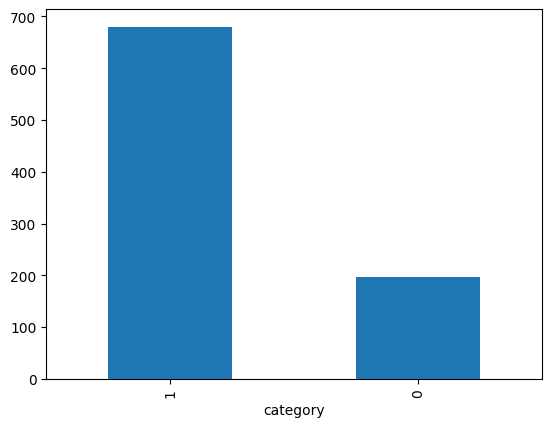

In [ ]:
df['category'].value_counts().plot.bar()

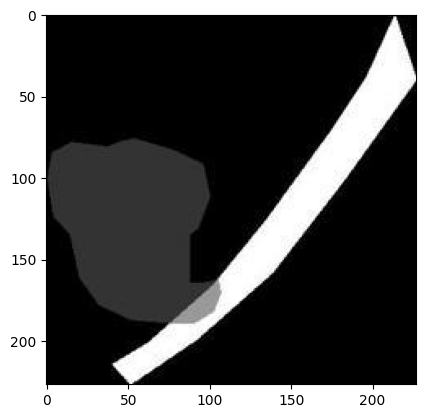

In [ ]:
sample = random.choice(filenames)
image = load_img("/content/my_extracted_folder/DataZipExtracted/Data/Train/Train Labels/"+sample)
plt.imshow(image)

# Defining MobileNet-Based Binary Classification Model

This cell constructs a binary classification model using MobileNet as the backbone with pretrained ImageNet weights. The earlier layers are frozen to retain general features, while deeper layers are fine-tuned. The extracted features are passed through global pooling, followed by dense layers with dropout and L2 regularization to reduce overfitting. A final sigmoid-activated layer outputs the binary prediction. The model is compiled using binary crossentropy loss and the Adam optimizer with a low learning rate, suitable for fine-tuning.

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalMaxPooling2D, Dense, Dropout
from tensorflow.keras import optimizers
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.regularizers import l2

image_size = 224
input_shape = (image_size, image_size, 3)

epochs = 35
batch_size = 16

pre_trained_model = MobileNet(input_shape=input_shape, include_top=False, weights="imagenet")

for layer in pre_trained_model.layers[:80]:
    layer.trainable = False

for layer in pre_trained_model.layers[80:]:
    layer.trainable = True

last_layer = pre_trained_model.get_layer('conv_pw_13_relu')
last_output = last_layer.output

x = GlobalMaxPooling2D()(last_output)

x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)
x = Dropout(0.6)(x)

x = Dense(1, activation='sigmoid')(x)

model = Model(pre_trained_model.input, x)

model.compile(loss='binary_crossentropy',
              optimizer=optimizers.Adam(learning_rate=3e-5),
              metrics=['accuracy'])

model.summary()

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 112, 112, 32)   │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 112, 112, 32)   │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 112, 112, 32)   │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 112, 112, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 112, 112, 64)   │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 113, 113, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 56, 56, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 56, 56, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 56, 56, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 56, 56, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 56, 56, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 3,754,177 (14.32 MB)

 Trainable params: 1,587,201 (6.05 MB)

 Non-trainable params: 2,166,976 (8.27 MB)

# Splitting Dataset for Classification with Leakage Check

This cell splits the labeled dataset into training and validation sets using stratified sampling to preserve class balance. It performs an overlap check to ensure there is no data leakage between the splits. If any duplicate entries are found, a warning is raised. Finally, it resets the DataFrame indices and stores the sample counts for later use in training.


In [ ]:
from sklearn.model_selection import train_test_split

train_df, validate_df = train_test_split(df, test_size=0.1, stratify=df['category'], random_state=42)

overlap = train_df.merge(validate_df, how='inner')

if not overlap.empty:
    print(f"Warning: {len(overlap)} overlapping samples found!")
else:
    print("No data leakage detected.")


train_df = train_df.reset_index()
validate_df = validate_df.reset_index()

total_train = train_df.shape[0]
total_validate = validate_df.shape[0]

No data leakage detected.


# Training Data Generator with Augmentation

This cell prepares a data generator for the training set using ImageDataGenerator. It applies real-time data augmentation techniques like rotation, shifting, zooming, and flipping to improve generalization and prevent overfitting. Images are rescaled to normalize pixel values. The generator is then configured to read images and labels from the training DataFrame and directory, producing batches for model training.

In [ ]:
train_df['category'] = train_df['category'].astype(str)

image_size = 224
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory="/content/my_extracted_folder/DataZipExtracted/Data/Train/Train Labels",
    x_col="filename",
    y_col="category",
    class_mode="binary",
    target_size=(image_size, image_size),
    batch_size=batch_size,
    shuffle=True
)

print("Data generator created successfully!")


Found 788 validated image filenames belonging to 2 classes.
Data generator created successfully!


# Validation Data Generator Setup

This cell sets up the validation data generator using only rescaling (no augmentation) to ensure consistent and reliable evaluation. It reads the validation images and labels from the DataFrame and directory, processes them to the desired size and batch format, and ensures shuffling is disabled to preserve order during evaluation.

In [ ]:
validate_df['category'] = validate_df['category'].astype(str)

validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df,
    "/content/my_extracted_folder/DataZipExtracted/Data/Train/Train Labels",
    x_col='filename',
    y_col='category',
    class_mode="binary",
    target_size=(224, 224),
    batch_size=32,
    shuffle=False
)

Found 88 validated image filenames belonging to 2 classes.


# Training the Classification Model with Callbacks

This cell trains the binary classification model using the augmented training data and rescaled validation data. It employs two key callbacks: EarlyStopping halts training if validation loss doesn’t improve for several epochs, restoring the best weights; ReduceLROnPlateau lowers the learning rate on plateauing validation loss. These mechanisms enhance model generalization and training stability.

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, verbose=1, min_lr=1e-6)

history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    callbacks=[early_stopping, reduce_lr],
    batch_size=batch_size
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 33s 935ms/step - accuracy: 0.5707 - loss: 10.1234 - val_accuracy: 0.7386 - val_loss: 7.5864 - learning_rate: 3.0000e-05
Epoch 2/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 503ms/step - accuracy: 0.6255 - loss: 9.0491 - val_accuracy: 0.7386 - val_loss: 7.3796 - learning_rate: 3.0000e-05
Epoch 3/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 467ms/step - accuracy: 0.6607 - loss: 8.6235 - val_accuracy: 0.7727 - val_loss: 7.2264 - learning_rate: 3.0000e-05
Epoch 4/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 473ms/step - accuracy: 0.6621 - loss: 8.3663 - val_accuracy: 0.8068 - val_loss: 7.0870 - learning_rate: 3.0000e-05
Epoch 5/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 477ms/step - accuracy: 0.6643 - loss: 8.1371 - val_accuracy: 0.8182 - val_loss: 7.0014 - learning_rate: 3.0000e-05
Epoch 6/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 12s 474ms/step - accuracy: 0.7153 - loss: 7.7746 - val_accuracy: 0.8523 - val_loss: 6.9348 - learning_rate: 3.0000e-05
Epoch 7/35
25/25 ━━━━━━━━━━━━━━━━━━━━ 21s 482ms/step - ac

# End-to-End Evaluation : Visualizing Classification via Segmentation

This cell bridges segmentation and classification by comparing predictions from both Ground Truth mask images and Predicted Segmentation masks. For selected validation indices, it visualizes the original image, true mask, predicted mask, and corresponding classification outputs (Actual Class(doctor), Ground Truth Pred, Predicted Mask Pred classes). This comprehensive visualization helps assess how well segmentation output contributes to binary classification (contact vs. no contact).

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


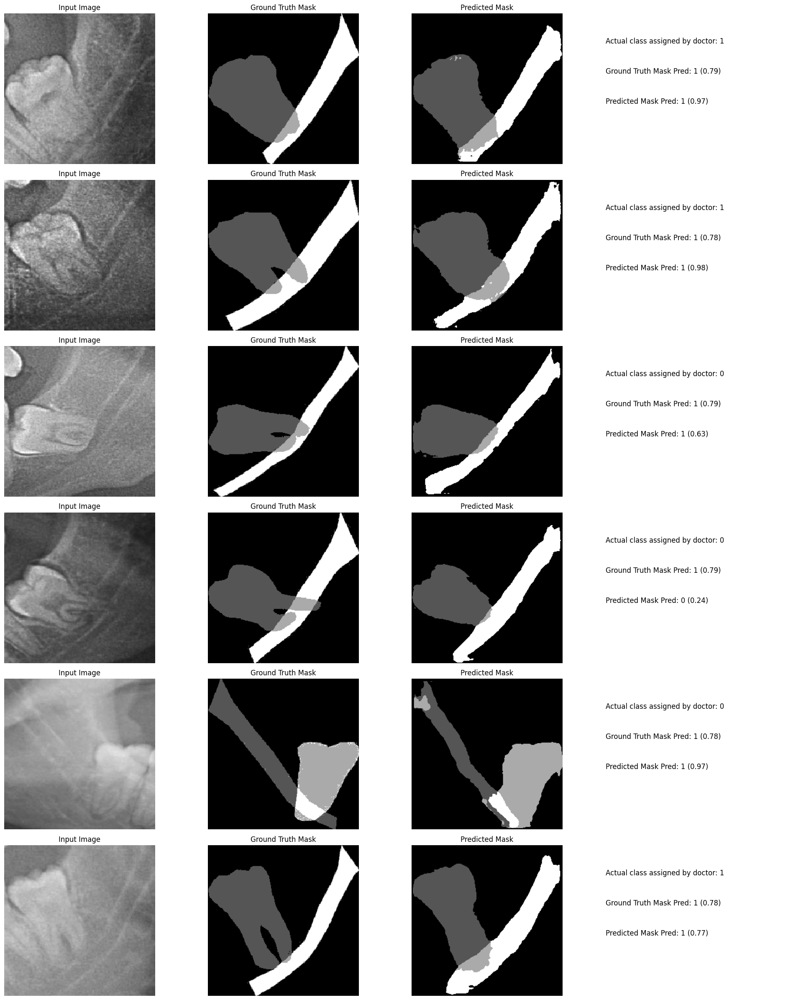

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def decode_segmentation_mask(pred_mask):
    pred_labels = np.argmax(pred_mask, axis=-1)
    intensity_map = {0: 0, 1: 85, 2: 170, 3: 255}
    decoded_mask = np.zeros_like(pred_labels, dtype=np.uint8)
    for k, v in intensity_map.items():
        decoded_mask[pred_labels == k] = v
    return decoded_mask

def prepare_for_classification(image):
    image_resized = cv2.resize(image, (224, 224))
    image_resized = image_resized.astype('float32') / 255.0
    return np.expand_dims(image_resized, axis=0)

def show_multiple_predictions(indices):
    plt.figure(figsize=(20, len(indices) * 4))

    for i, idx in enumerate(indices):
        img = X_val[idx]
        true_mask = y_val[idx].squeeze()

        filename = validate_df.loc[idx, 'filename']
        actual_class = validate_df.loc[idx, 'category']

        pred_mask = segmentation_model.predict(np.expand_dims(img, axis=0))[0]
        decoded_pred_mask = decode_segmentation_mask(pred_mask)

        input_img = prepare_for_classification(img)
        pred_mask_img = cv2.merge([decoded_pred_mask]*3)
        pred_mask_img = prepare_for_classification(pred_mask_img)

        original_pred_prob = model.predict(input_img)[0][0]
        original_pred = 1 if original_pred_prob > 0.5 else 0

        mask_based_pred_prob = model.predict(pred_mask_img)[0][0]
        mask_based_pred = 1 if mask_based_pred_prob > 0.5 else 0

        plt.subplot(len(indices), 4, i * 4 + 1)
        plt.imshow(img)
        plt.title("Input Image")
        plt.axis('off')

        plt.subplot(len(indices), 4, i * 4 + 2)
        plt.imshow(true_mask * 85, cmap='gray')
        plt.title("Ground Truth Mask")
        plt.axis('off')

        plt.subplot(len(indices), 4, i * 4 + 3)
        plt.imshow(decoded_pred_mask, cmap='gray')
        plt.title("Predicted Mask")
        plt.axis('off')

        plt.subplot(len(indices), 4, i * 4 + 4)
        plt.axis('off')
        plt.text(0.1, 0.8, f"Actual class assigned by doctor: {actual_class}", fontsize=12)
        plt.text(0.1, 0.6, f"Ground Truth Mask Pred: {original_pred} ({original_pred_prob:.2f})", fontsize=12)
        plt.text(0.1, 0.4, f"Predicted Mask Pred: {mask_based_pred} ({mask_based_pred_prob:.2f})", fontsize=12)

    plt.tight_layout()
    plt.show()

show_multiple_predictions([0, 1, 2, 3, 4, 5])

# Final Model Evaluation on Validation Set

This cell evaluates the classification model’s performance using the validation dataset. It calculates and prints the final loss and accuracy after training, giving a quantitative measure of how well the model generalizes to unseen data.

In [ ]:
loss, accuracy = model.evaluate(validation_generator, steps=total_validate // batch_size)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8958 - loss: 5.7475
Test: accuracy = 0.906250  ;  loss = 5.737580 


# Model Training Performance Visualization

This cell visualizes the model's training history. Two plots are generated :-

    Accuracy Plot: Compares training and validation accuracy across epochs.

    Loss Plot: Compares training and validation loss across epochs.

These graphs help identify underfitting, overfitting, or balanced learning behavior.

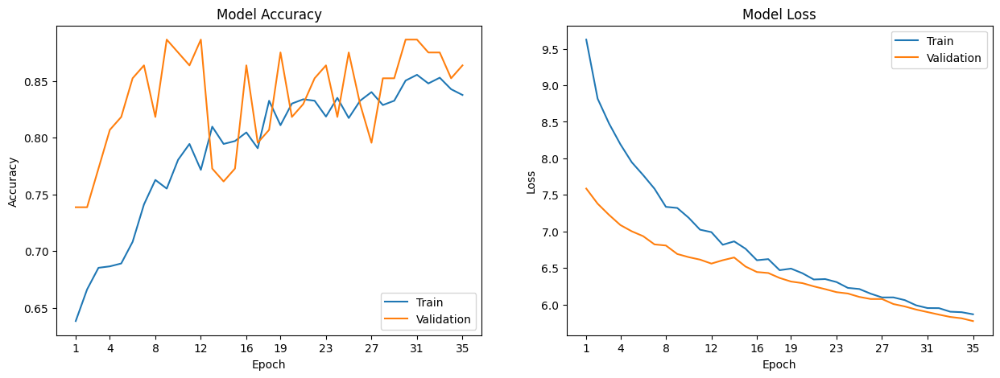

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_model_history(model_history, acc='accuracy', val_acc='val_accuracy'):
    fig, axs = plt.subplots(1, 2, figsize=(15, 5))


    axs[0].plot(range(1, len(model_history.history[acc]) + 1), model_history.history[acc])
    axs[0].plot(range(1, len(model_history.history[val_acc]) + 1), model_history.history[val_acc])
    axs[0].set_title('Model Accuracy')
    axs[0].set_ylabel('Accuracy')
    axs[0].set_xlabel('Epoch')
    axs[0].set_xticks(np.linspace(1, len(model_history.history[acc]), 10, dtype=int))
    axs[0].legend(['Train', 'Validation'], loc='best')


    axs[1].plot(range(1, len(model_history.history['loss']) + 1), model_history.history['loss'])
    axs[1].plot(range(1, len(model_history.history['val_loss']) + 1), model_history.history['val_loss'])
    axs[1].set_title('Model Loss')
    axs[1].set_ylabel('Loss')
    axs[1].set_xlabel('Epoch')
    axs[1].set_xticks(np.linspace(1, len(model_history.history['loss']), 10, dtype=int))
    axs[1].legend(['Train', 'Validation'], loc='best')

    plt.show()

plot_model_history(history)


# Confusion Matrix

This code generates a confusion matrix to evaluate the classification performance on the validation set. It compares :-

     True Labels (Y_val)

     Predicted Labels (y_final)

The matrix shows :-

    True Positives (TP)

    True Negatives (TN)

    False Positives (FP)

    False Negatives (FN)

Helpful to assess model precision, recall, and misclassification trends.

3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step


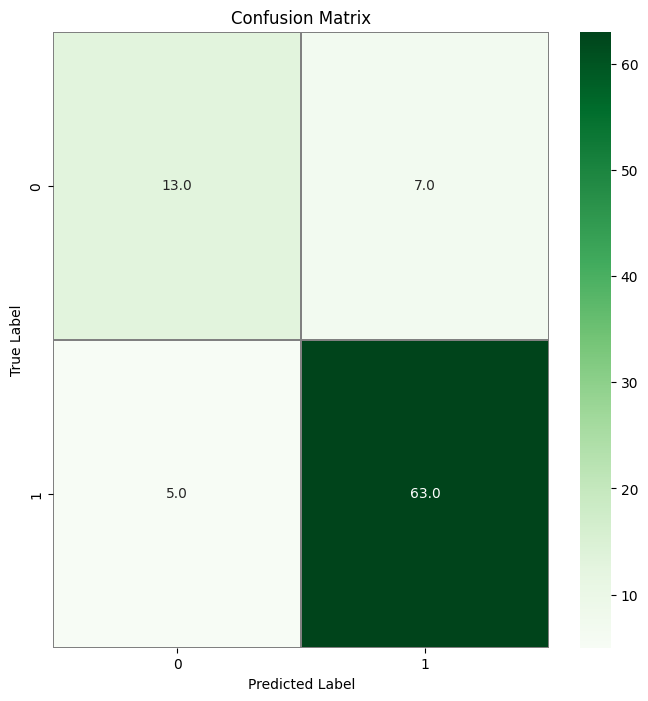

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

Y_val = validate_df['category'].astype(int)
y_final = (model.predict(validation_generator) > 0.5).astype(int).flatten()

confusion_mtx = confusion_matrix(Y_val, y_final)

f, ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt='.1f', ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


# Classification Report

This code produces a detailed performance summary of the binary classifier on validation data. It includes key metrics :-

    Precision: How many predicted positives are actually positive.

    Recall: How many actual positives the model detected.

    F1-score: Harmonic mean of precision and recall, balancing both.

    Support: Number of true instances for each class.

The report helps identify model strengths and weaknesses per class (0 = no contact, 1 = contact).

In [ ]:
from sklearn.metrics import classification_report

report = classification_report(Y_val, y_final, target_names=['0','1'])

print(report)

              precision    recall  f1-score   support

           0       0.72      0.65      0.68        20
           1       0.90      0.93      0.91        68

    accuracy                           0.86        88
   macro avg       0.81      0.79      0.80        88
weighted avg       0.86      0.86      0.86        88

